### 幸福指数地图绘制

#### 数据处理

In [1]:
import numpy as np
import pandas as pd
# 每个首都的GDP值
concap = pd.read_csv('concap.csv')
concap.head(10)

,CountryName,CapitalName,CapitalLatitude,CapitalLongitude,CountryCode,ContinentName
0,Somaliland,Hargeisa,9.550000,44.050000,NaN,Africa
1,South Georgia and South Sandwich Islands,King Edward Point,-54.283333,-36.500000,GS,Antarctica
2,French Southern and Antarctic Lands,Port-aux-Français,-49.350000,70.216667,TF,Antarctica
3,Palestine,Jerusalem,31.766667,35.233333,PS,Asia
4,Aland Islands,Mariehamn,60.116667,19.900000,AX,Europe
5,Nauru,Yaren,-0.547700,166.920867,NR,Australia
6,Saint Martin,Marigot,18.073100,-63.082200,MF,North America
7,Tokelau,Atafu,-9.166667,-171.833333,TK,Australia
8,Western Sahara,El-Aaiún,27.153611,-13.203333,EH,Africa
9,Afghanistan,Kabul,34.516667,69.183333,AF,Asia


In [2]:
concap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245 entries, 0 to 244
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   CountryName       245 non-null    object 
 1   CapitalName       241 non-null    object 
 2   CapitalLatitude   245 non-null    float64
 3   CapitalLongitude  245 non-null    float64
 4   CountryCode       242 non-null    object 
 5   ContinentName     245 non-null    object 
dtypes: float64(2), object(4)
memory usage: 11.6+ KB


In [3]:
# 2015年的幸福指数排行表
happiness_2015 = pd.read_csv('2015.csv')
happiness_2015.head(10)

,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Switzerland,Western Europe,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,2.51738
1,Iceland,Western Europe,2,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,2.70201
2,Denmark,Western Europe,3,7.527,0.03328,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139,2.49204
3,Norway,Western Europe,4,7.522,0.03880,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699,2.46531
4,Canada,North America,5,7.427,0.03553,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811,2.45176
5,Finland,Western Europe,6,7.406,0.03140,1.29025,1.31826,0.88911,0.64169,0.41372,0.23351,2.61955
6,Netherlands,Western Europe,7,7.378,0.02799,1.32944,1.28017,0.89284,0.61576,0.31814,0.47610,2.46570
7,Sweden,Western Europe,8,7.364,0.03157,1.33171,1.28907,0.91087,0.65980,0.43844,0.36262,2.37119
8,New Zealand,Australia and New Zealand,9,7.286,0.03371,1.25018,1.31967,0.90837,0.63938,0.42922,0.47501,2.26425
9,Australia,Australia and New Zealand,10,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.35637,0.43562,2.26646


In [4]:
happiness_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158 entries, 0 to 157
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        158 non-null    object 
 1   Region                         158 non-null    object 
 2   Happiness Rank                 158 non-null    int64  
 3   Happiness Score                158 non-null    float64
 4   Standard Error                 158 non-null    float64
 5   Economy (GDP per Capita)       158 non-null    float64
 6   Family                         158 non-null    float64
 7   Health (Life Expectancy)       158 non-null    float64
 8   Freedom                        158 non-null    float64
 9   Trust (Government Corruption)  158 non-null    float64
 10  Generosity                     158 non-null    float64
 11  Dystopia Residual              158 non-null    float64
dtypes: float64(9), int64(1), object(2)
memory usage: 1

In [5]:
data = pd.merge(concap[['CountryName', 'CapitalName', 'CapitalLatitude', 'CapitalLongitude']],happiness_2015,left_on = ['CountryName'],right_on = ['Country'])
data

,CountryName,CapitalName,CapitalLatitude,CapitalLongitude,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Afghanistan,Kabul,34.516667,69.183333,Afghanistan,Southern Asia,153,3.575,0.03084,0.31982,0.30285,0.30335,0.23414,0.09719,0.36510,1.95210
1,Albania,Tirana,41.316667,19.816667,Albania,Central and Eastern Europe,95,4.959,0.05013,0.87867,0.80434,0.81325,0.35733,0.06413,0.14272,1.89894
2,Algeria,Algiers,36.750000,3.050000,Algeria,Middle East and Northern Africa,68,5.605,0.05099,0.93929,1.07772,0.61766,0.28579,0.17383,0.07822,2.43209
3,Angola,Luanda,-8.833333,13.216667,Angola,Sub-Saharan Africa,137,4.033,0.04758,0.75778,0.86040,0.16683,0.10384,0.07122,0.12344,1.94939
4,Argentina,Buenos Aires,-34.583333,-58.666667,Argentina,Latin America and Caribbean,30,6.574,0.04612,1.05351,1.24823,0.78723,0.44974,0.08484,0.11451,2.83600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147,Vietnam,Hanoi,21.033333,105.850000,Vietnam,Southeastern Asia,75,5.360,0.03107,0.63216,0.91226,0.74676,0.59444,0.10441,0.16860,2.20173
148,Yemen,Sanaa,15.350000,44.200000,Yemen,Middle East and Northern Africa,136,4.077,0.04367,0.54649,0.68093,0.40064,0.35571,0.07854,0.09131,1.92313
149,Zambia,Lusaka,-15.416667,28.283333,Zambia,Sub-Saharan Africa,85,5.129,0.06988,0.47038,0.91612,0.29924,0.48827,0.12468,0.19591,2.63430
150,Zimbabwe,Harare,-17.816667,31.033333,Zimbabwe,Sub-Saharan Africa,115,4.610,0.04290,0.27100,1.03276,0.33475,0.25861,0.08079,0.18987,2.44191


In [6]:
data[data['CountryName'].isnull()]

,CountryName,CapitalName,CapitalLatitude,CapitalLongitude,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual


In [7]:
data[data['Country'].isnull()]

,CountryName,CapitalName,CapitalLatitude,CapitalLongitude,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual


In [8]:
# 说明数据一一对应,可以删去其中一列
data = data.drop('CountryName',axis = 1)
data

,CapitalName,CapitalLatitude,CapitalLongitude,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Kabul,34.516667,69.183333,Afghanistan,Southern Asia,153,3.575,0.03084,0.31982,0.30285,0.30335,0.23414,0.09719,0.36510,1.95210
1,Tirana,41.316667,19.816667,Albania,Central and Eastern Europe,95,4.959,0.05013,0.87867,0.80434,0.81325,0.35733,0.06413,0.14272,1.89894
2,Algiers,36.750000,3.050000,Algeria,Middle East and Northern Africa,68,5.605,0.05099,0.93929,1.07772,0.61766,0.28579,0.17383,0.07822,2.43209
3,Luanda,-8.833333,13.216667,Angola,Sub-Saharan Africa,137,4.033,0.04758,0.75778,0.86040,0.16683,0.10384,0.07122,0.12344,1.94939
4,Buenos Aires,-34.583333,-58.666667,Argentina,Latin America and Caribbean,30,6.574,0.04612,1.05351,1.24823,0.78723,0.44974,0.08484,0.11451,2.83600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147,Hanoi,21.033333,105.850000,Vietnam,Southeastern Asia,75,5.360,0.03107,0.63216,0.91226,0.74676,0.59444,0.10441,0.16860,2.20173
148,Sanaa,15.350000,44.200000,Yemen,Middle East and Northern Africa,136,4.077,0.04367,0.54649,0.68093,0.40064,0.35571,0.07854,0.09131,1.92313
149,Lusaka,-15.416667,28.283333,Zambia,Sub-Saharan Africa,85,5.129,0.06988,0.47038,0.91612,0.29924,0.48827,0.12468,0.19591,2.63430
150,Harare,-17.816667,31.033333,Zimbabwe,Sub-Saharan Africa,115,4.610,0.04290,0.27100,1.03276,0.33475,0.25861,0.08079,0.18987,2.44191


#### 世界幸福指数散点图

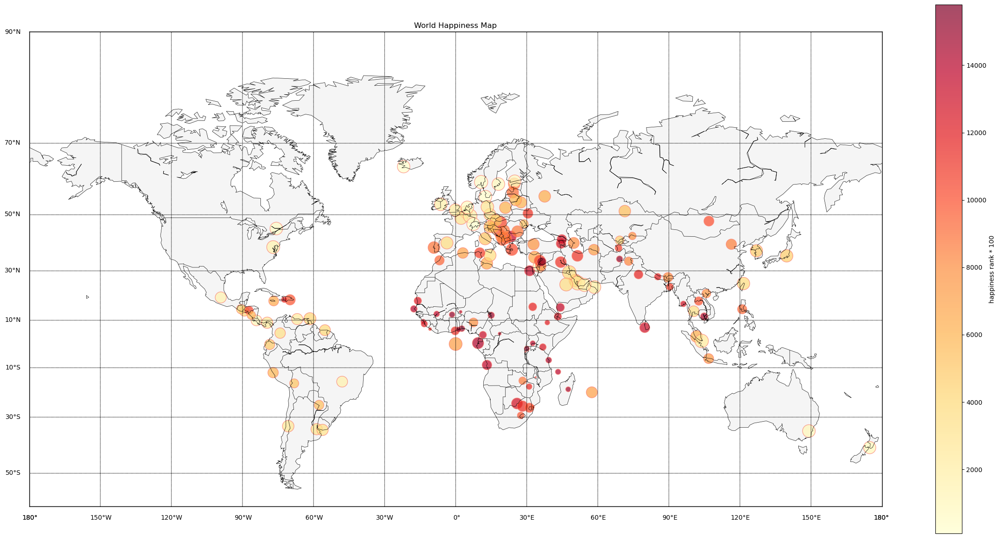

In [9]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

def world_happiness_map():
    map = Basemap(projection = 'mill',llcrnrlat=-60,urcrnrlat=90,llcrnrlon=-180,urcrnrlon=180,resolution='c') # crude resolution
    map.drawcoastlines(linewidth = 0.5)
    map.drawcountries(linewidth = 0.5)
    map.fillcontinents(color = 'whitesmoke')
    map.drawmapboundary(linewidth = 1)

    map.drawmeridians(range(-180,181,30),labels = [False,False,False,True])
    map.drawparallels(range(-90,91,20),labels = [True,False,False,False])

    x = data['CapitalLongitude'].values
    y = data['CapitalLatitude'].values
    happy = data['Happiness Rank'].values
    gdp = data['Economy (GDP per Capita)'].values
    happiness = map.scatter(x,y,latlon = True, s = 300*gdp, c = 100*happy, cmap = 'YlOrRd', marker = 'o',linewidth = 1, edgecolor = 'salmon', alpha = 0.7)

    plt.colorbar(happiness,label = 'happiness rank * 100')
    plt.title('World Happiness Map')
    plt.show()

plt.figure(figsize = (30,15))
world_happiness_map()

### 欧洲幸福度指数地图

#### 整理数据

In [10]:
concap.head(5)

,CountryName,CapitalName,CapitalLatitude,CapitalLongitude,CountryCode,ContinentName
0,Somaliland,Hargeisa,9.550000,44.050000,NaN,Africa
1,South Georgia and South Sandwich Islands,King Edward Point,-54.283333,-36.500000,GS,Antarctica
2,French Southern and Antarctic Lands,Port-aux-Français,-49.350000,70.216667,TF,Antarctica
3,Palestine,Jerusalem,31.766667,35.233333,PS,Asia
4,Aland Islands,Mariehamn,60.116667,19.900000,AX,Europe


In [11]:
happiness_2015.head(5)

,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Switzerland,Western Europe,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,2.51738
1,Iceland,Western Europe,2,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,2.70201
2,Denmark,Western Europe,3,7.527,0.03328,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139,2.49204
3,Norway,Western Europe,4,7.522,0.03880,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699,2.46531
4,Canada,North America,5,7.427,0.03553,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811,2.45176


In [12]:
data.head(5)

,CapitalName,CapitalLatitude,CapitalLongitude,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Kabul,34.516667,69.183333,Afghanistan,Southern Asia,153,3.575,0.03084,0.31982,0.30285,0.30335,0.23414,0.09719,0.36510,1.95210
1,Tirana,41.316667,19.816667,Albania,Central and Eastern Europe,95,4.959,0.05013,0.87867,0.80434,0.81325,0.35733,0.06413,0.14272,1.89894
2,Algiers,36.750000,3.050000,Algeria,Middle East and Northern Africa,68,5.605,0.05099,0.93929,1.07772,0.61766,0.28579,0.17383,0.07822,2.43209
3,Luanda,-8.833333,13.216667,Angola,Sub-Saharan Africa,137,4.033,0.04758,0.75778,0.86040,0.16683,0.10384,0.07122,0.12344,1.94939
4,Buenos Aires,-34.583333,-58.666667,Argentina,Latin America and Caribbean,30,6.574,0.04612,1.05351,1.24823,0.78723,0.44974,0.08484,0.11451,2.83600


In [13]:
eu_data = data[data['Region'].isin(['Western Europe','Central and Eastern Europe'])]
eu_data

,CapitalName,CapitalLatitude,CapitalLongitude,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
1,Tirana,41.316667,19.816667,Albania,Central and Eastern Europe,95,4.959,0.05013,0.87867,0.80434,0.81325,0.35733,0.06413,0.14272,1.89894
5,Yerevan,40.166667,44.500000,Armenia,Central and Eastern Europe,127,4.350,0.04763,0.76821,0.77711,0.72990,0.19847,0.03900,0.07855,1.75873
7,Vienna,48.200000,16.366667,Austria,Western Europe,13,7.200,0.03751,1.33723,1.29704,0.89042,0.62433,0.18676,0.33088,2.53320
8,Baku,40.383333,49.866667,Azerbaijan,Central and Eastern Europe,80,5.212,0.03363,1.02389,0.93793,0.64045,0.37030,0.16065,0.07799,2.00073
11,Minsk,53.900000,27.566667,Belarus,Central and Eastern Europe,59,5.813,0.03938,1.03192,1.23289,0.73608,0.37938,0.19090,0.11046,2.13090
12,Brussels,50.833333,4.333333,Belgium,Western Europe,19,6.937,0.03595,1.30782,1.28566,0.89667,0.58450,0.22540,0.22250,2.41484
16,Sarajevo,43.866667,18.416667,Bosnia and Herzegovina,Central and Eastern Europe,96,4.949,0.06913,0.83223,0.91916,0.79081,0.09245,0.00227,0.24808,2.06367
19,Sofia,42.683333,23.316667,Bulgaria,Central and Eastern Europe,134,4.218,0.04828,1.01216,1.10614,0.76649,0.30587,0.00872,0.11921,0.89991
33,Zagreb,45.800000,16.000000,Croatia,Central and Eastern Europe,62,5.759,0.04394,1.08254,0.79624,0.78805,0.25883,0.02430,0.05444,2.75414
34,Nicosia,35.166667,33.366667,Cyprus,Western Europe,67,5.689,0.05580,1.20813,0.89318,0.92356,0.40672,0.06146,0.30638,1.88931


In [14]:
eu_data['CapitalName'].sort_values

<bound method Series.sort_values of 1          Tirana
5         Yerevan
7          Vienna
8            Baku
11          Minsk
12       Brussels
16       Sarajevo
19          Sofia
33         Zagreb
34        Nicosia
35         Prague
36     Copenhagen
42        Tallinn
44       Helsinki
45          Paris
47        Tbilisi
48         Berlin
50         Athens
55       Budapest
56      Reykjavik
61         Dublin
63           Rome
67         Astana
70       Pristina
72        Bishkek
74           Riga
79        Vilnius
80     Luxembourg
81         Skopje
86       Valletta
90       Chisinau
92      Podgorica
96      Amsterdam
101          Oslo
108        Warsaw
109        Lisbon
111     Bucharest
112        Moscow
116      Belgrade
119    Bratislava
120     Ljubljana
122        Madrid
127     Stockholm
128          Bern
131      Dushanbe
138      Ashgabat
140          Kyiv
142        London
145      Tashkent
Name: CapitalName, dtype: object>

#### 设计函数

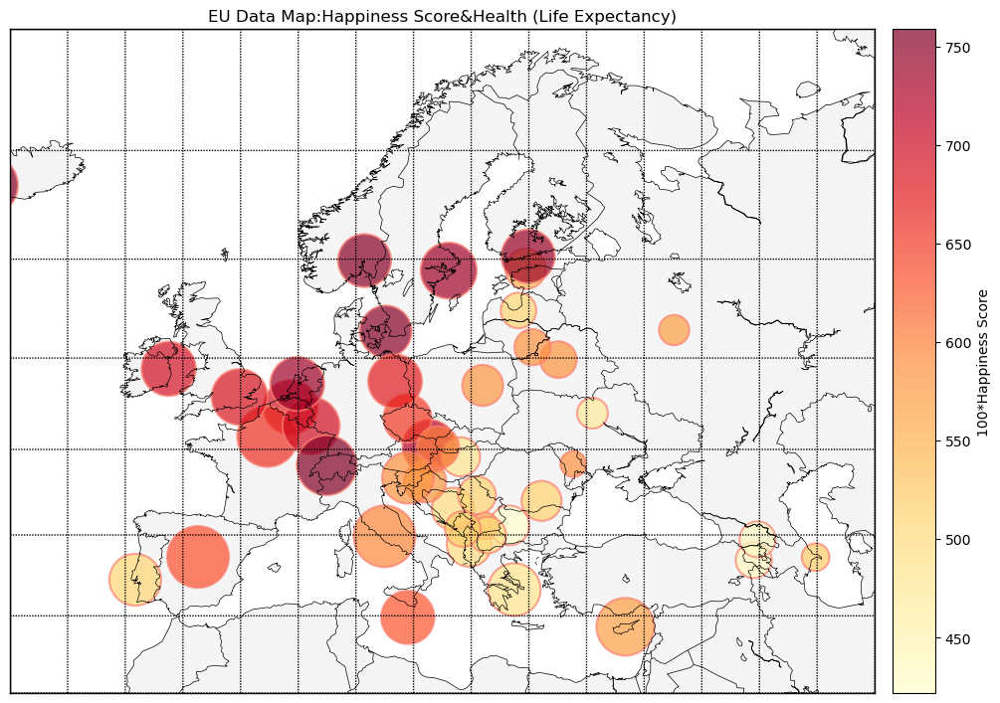

In [38]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

def eu_happiness_map(color,size,colorbar = True):
    
    map = Basemap(projection = 'mill',llcrnrlat=30,urcrnrlat=72,llcrnrlon=-20,urcrnrlon=55,resolution='l')
    
    map.drawcoastlines(linewidth = 0.5)
    map.drawstates(linewidth = 0.25,color = 'grey')
    map.drawcountries(linewidth = 0.5)
    map.fillcontinents(color = 'whitesmoke')
    map.drawmapboundary(linewidth = 1)

    map.drawparallels(np.arange(30,73,6))
    map.drawmeridians(np.arange(-20,56,5))

    lon,lat = map(eu_data['CapitalLongitude'],eu_data['CapitalLatitude'])
    map_color = eu_data[color].values
    map_size = eu_data[size].values

    map.scatter(lon,lat, c = 100 * map_color, cmap = 'YlOrRd', s = (7 * map_size)**4, linewidth = 1.5, edgecolor = 'salmon', alpha = 0.7)
    if colorbar == True:
        map.colorbar(label = f'100*{color}')

    else:
        pass
    
    plt.title(f'EU Data Map:{color}&{size}')

plt.figure(figsize = (12,12))

eu_happiness_map('Happiness Score','Health (Life Expectancy)')

#### 做出对比图

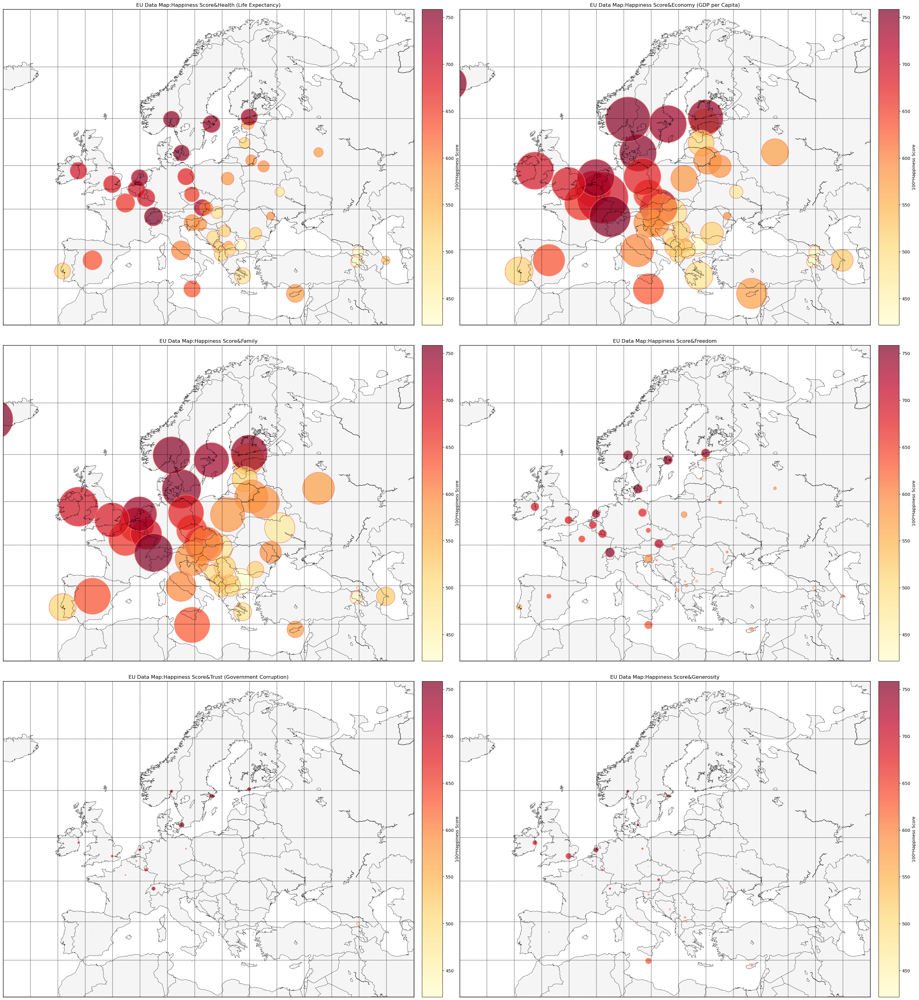

In [39]:
fig = plt.figure(figsize = (30,33)) # 水平长度,垂直长度

axes1 = fig.add_subplot(321)
eu_happiness_map('Happiness Score','Health (Life Expectancy)')
axes1 = fig.add_subplot(322)
eu_happiness_map('Happiness Score','Economy (GDP per Capita)')
axes1 = fig.add_subplot(323)
eu_happiness_map('Happiness Score','Family')
axes1 = fig.add_subplot(324)
eu_happiness_map('Happiness Score','Freedom')
axes1 = fig.add_subplot(325)
eu_happiness_map('Happiness Score','Trust (Government Corruption)')
axes1 = fig.add_subplot(326)
eu_happiness_map('Happiness Score','Generosity')

plt.tight_layout()

### 根据shp绘制地图

#### 绘制基础shp地图

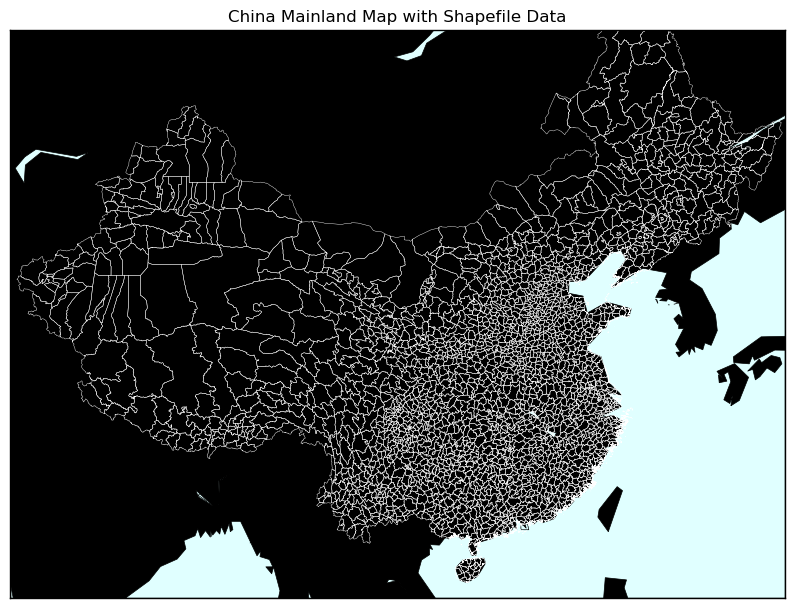

In [45]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

map = Basemap(projection='merc', lon_0=104, lat_0=35, llcrnrlon=73, llcrnrlat=17, urcrnrlon=135, urcrnrlat=53)

plt.figure(figsize=(10, 8))
map.drawcoastlines(linewidth = 0.5)
map.drawcountries(linewidth = 0.5)
map.drawmapboundary(fill_color='lightcyan',linewidth = 1)
map.fillcontinents(color='k', lake_color='lightcyan')

shapefile_path = 'CHN_adm3'
map_info = map.readshapefile(shapefile_path, 'shapefile', drawbounds=True, linewidth=0.3, color='w')

plt.title('China Mainland Map with Shapefile Data')
plt.show()

#### 绘制省域地图

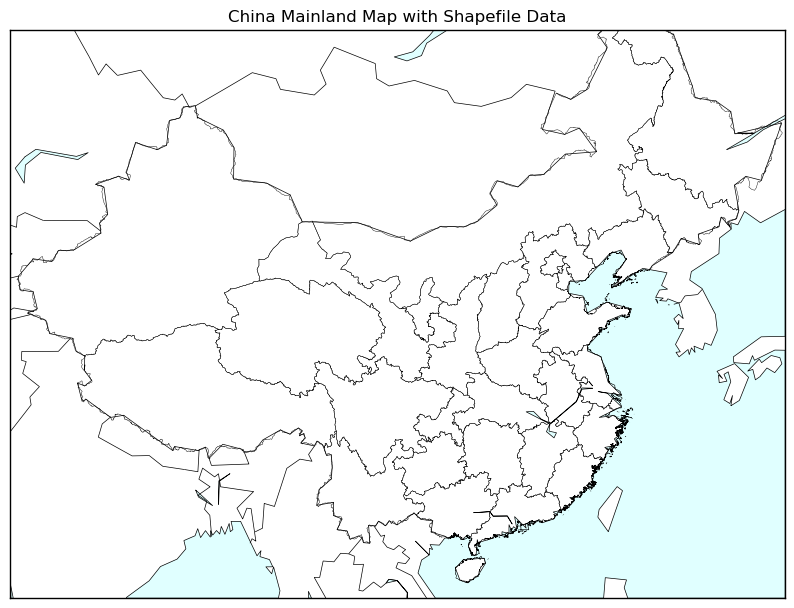

In [47]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

map = Basemap(projection='merc', lon_0=104, lat_0=35, llcrnrlon=73, llcrnrlat=17, urcrnrlon=135, urcrnrlat=53)

plt.figure(figsize=(10, 8))
map.drawcoastlines(linewidth = 0.5)
map.drawcountries(linewidth = 0.5)
map.drawmapboundary(fill_color='lightcyan',linewidth = 1)
map.fillcontinents(color='w', lake_color='lightcyan')

shapefile_path = 'CHN_adm1'
map_info = map.readshapefile(shapefile_path, 'shapefile', drawbounds=True, linewidth=0.3, color='k')

plt.title('China Mainland Map with Shapefile Data')
plt.show()

#### 绘制广东省省域的地图

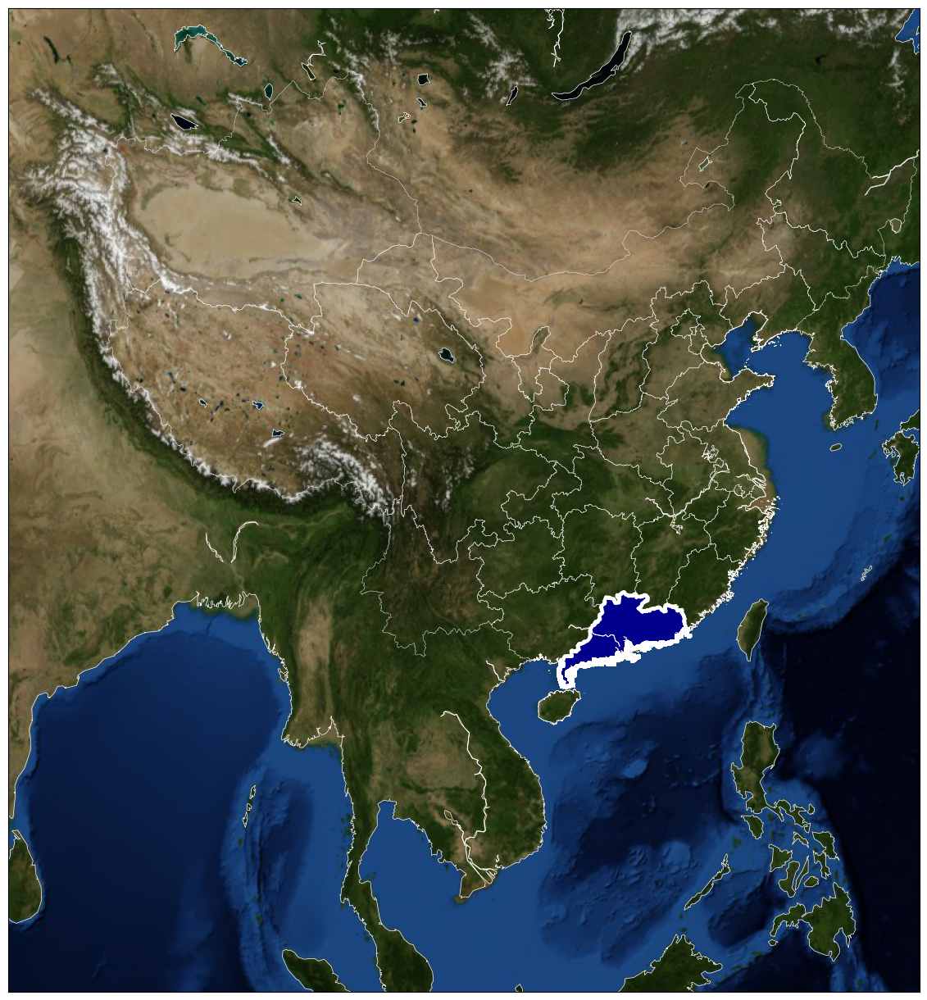

In [62]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from matplotlib.patches import Polygon # 绘制多边形

fig = plt.figure(figsize = (20,15))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8])

map = Basemap(projection = 'cass',llcrnrlon=80.33, llcrnrlat=3.01, urcrnrlon=138.16, urcrnrlat=56.123,lat_0 = 42.5,lon_0=120,resolution = 'l',ax = ax1)

shapefile_path = 'CHN_adm1'
shp_info = map.readshapefile(shapefile_path,'states',drawbounds=True, linewidth=0.3, color='w')
# shp_info是tuple
# readshapefile方法会返回一个元组(shapedata,shapeinfo)

for shapedata,shapeinfo in zip(map.states,map.states_info):
    province_name = shapeinfo['NAME_1']
    if province_name == 'Guangdong':
        poly = Polygon(shapedata, facecolor='darkblue', edgecolor='w', lw=3)
        ax1.add_patch(poly)

map.drawcoastlines(linewidth = 0.5,color = 'w')
map.warpimage() # NASA蓝色大理石图像

plt.show()

#### 中国人口分布数据图

In [2]:
import pandas as pd
popdata = pd.read_excel('2015Cities-CHINA.xlsx')
popdata.head(10)

,排名,cities,pop,GDP,GDP_Average,GDP_Avrg(Dollar),lon,lat
0,1,重庆市,2884.62,7894.24,27367,4043,106.504959,29.533155
1,2,上海市,2301.91,16872.42,73297,10828,121.472641,31.231707
2,3,北京市,1961.24,13777.90,70251,10378,116.405289,39.904987
3,4,成都市,1404.76,5551.30,39518,5838,104.065735,30.659462
4,5,天津市,1293.82,9108.83,70402,10400,117.190186,39.125595
5,6,广州市,1270.08,10604.48,83495,12334,113.280640,23.125177
6,7,保定市,1119.44,2050.30,18315,2706,115.482330,38.867657
7,8,哈尔滨市,1063.60,3665.90,34467,5092,126.642464,45.756966
8,9,苏州市,1046.60,9000.00,85993,12703,120.619583,31.299379
9,10,深圳市,1035.79,9510.91,91822,13564,114.085945,22.547001


In [3]:
popdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 338 entries, 0 to 337
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   排名                338 non-null    int64  
 1   cities            338 non-null    object 
 2   pop               338 non-null    float64
 3   GDP               338 non-null    float64
 4   GDP_Average       338 non-null    int64  
 5   GDP_Avrg(Dollar)  338 non-null    int64  
 6   lon               130 non-null    float64
 7   lat               130 non-null    float64
dtypes: float64(4), int64(3), object(1)
memory usage: 21.3+ KB


#### 中国人口分布数据图 | 渐变

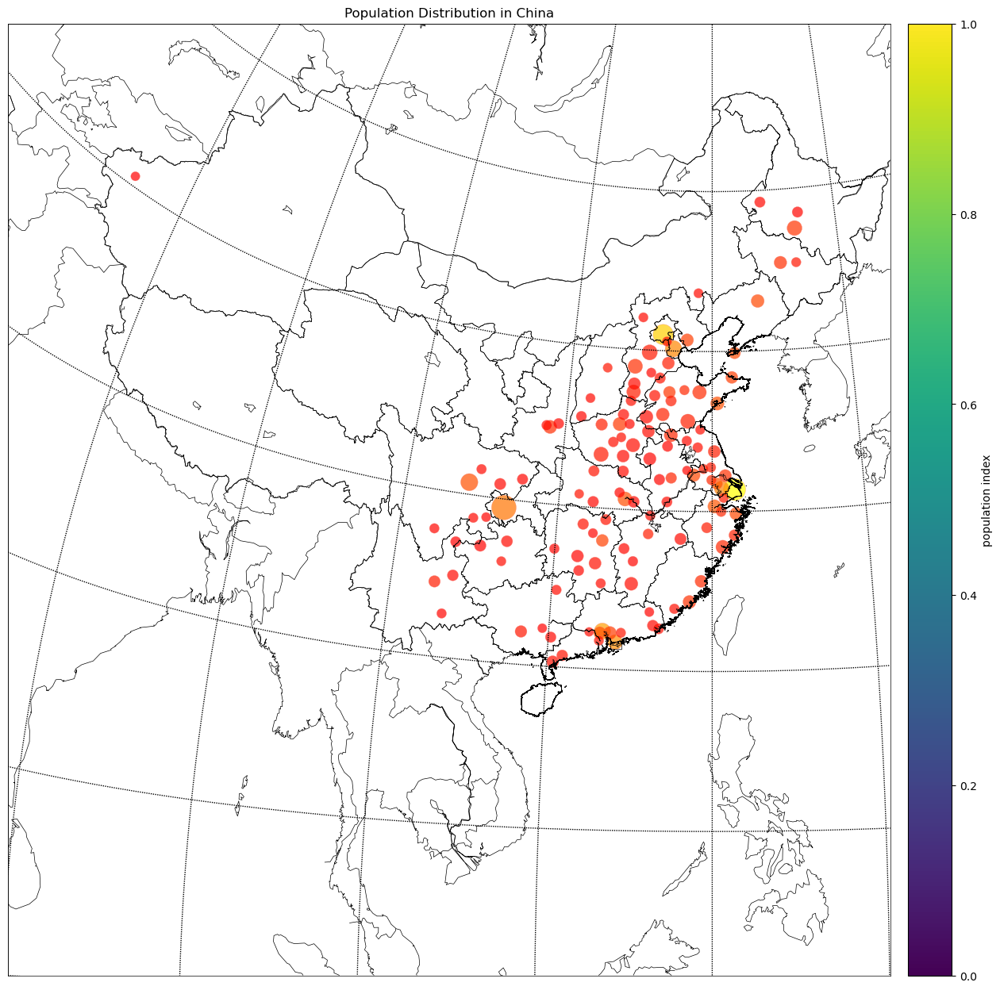

In [15]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import pandas as pd
import numpy as np

provinces = popdata['cities']
pop = popdata['pop']
gdp = popdata['GDP']
lat = popdata['lat']
lon = popdata['lon']

fig = plt.figure(figsize = (20,15))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8])



map = Basemap(llcrnrlon=80.33, 
              llcrnrlat=3.01, 
              urcrnrlon=138.16, 
              urcrnrlat=56.123,
             resolution='l', projection='cass', lat_0 = 42.5,lon_0=120,ax=ax1)
map.drawcoastlines(linewidth = 0.5)
map.drawcountries(linewidth = 0.5)
map.drawmapboundary(linewidth = 0.5)

map.drawparallels(np.arange(3,57,9))
map.drawmeridians(np.arange(80,140,10))

shp_path = 'CHN_adm1'
shp = map.readshapefile(shp_path,'states',drawbounds = True)

x,y = map(lon,lat)
color = gdp
size = (pop/np.max(pop)) * 500
map.scatter(x,y,c = color,cmap = 'autumn',s = size,linewidth = 0.3,edgecolor = 'salmon',alpha = 0.7)
map.colorbar(label = 'population index')
plt.title("Population Distribution in China")
plt.show()

### 色彩映射 cmap

In [17]:
popdata = pd.read_excel("provinces.xlsx")
popdata.head()

,province,pop
0,北京,21893095
1,天津,13866009
2,河北,74610235
3,山西,34915616
4,内蒙古,24049155


In [21]:
popdata['province'].sort_values()

8      上海
24     云南
4     内蒙古
0      北京
6      吉林
22     四川
1      天津
29     宁夏
11     安徽
14     山东
3      山西
18     广东
19     广西
30     新疆
9      江苏
13     江西
2      河北
15     河南
10     浙江
20     海南
16     湖北
17     湖南
27     甘肃
12     福建
25     西藏
23     贵州
5      辽宁
21     重庆
26     陕西
28     青海
7     黑龙江
Name: province, dtype: object

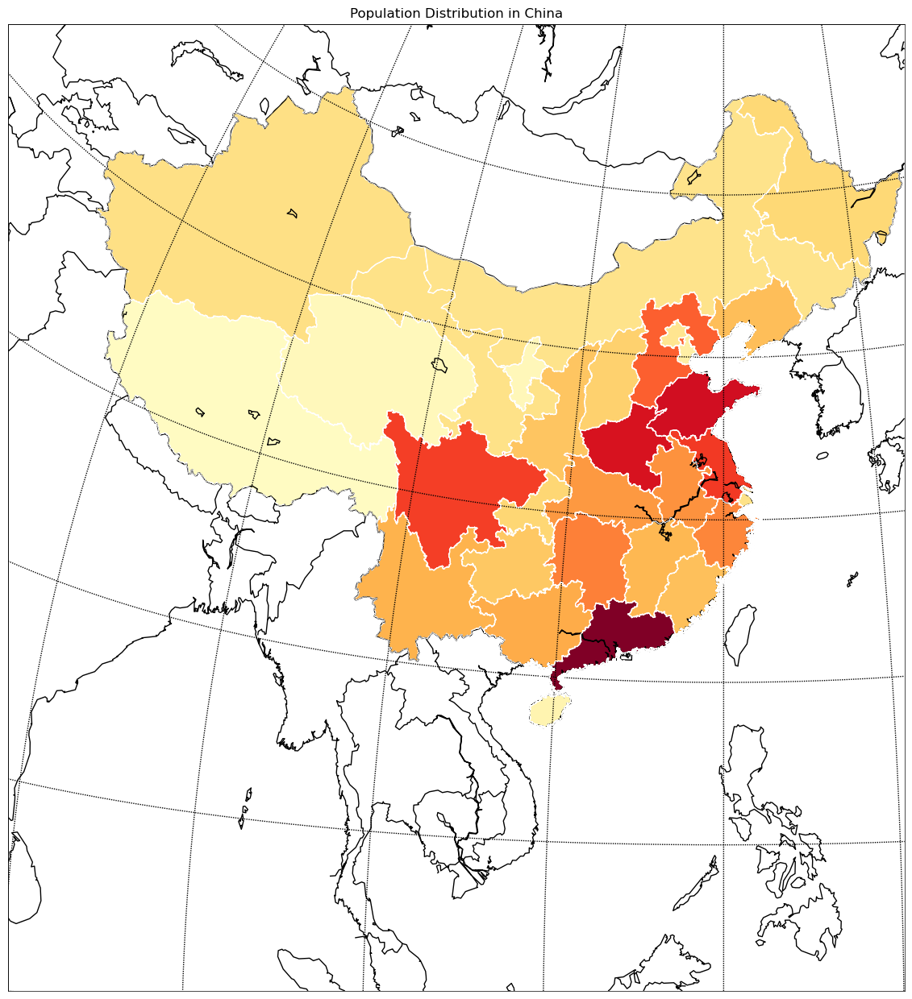

In [43]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import matplotlib
import pandas as pd

# 读取数据
popdata = pd.read_excel("provinces.xlsx")
provinces = np.array(popdata["province"][0:120])
pop = np.array(popdata["pop"][0:120])

def GetPopulationByProvince(province):

    # 函数的作用是输入一个城市,然后得到对应的人口数据,把城市和人口一一(for loop)对应(zip)起来
    for item in zip(provinces,pop):#('北京'，‘22000000’)
       
        if(item[0] == province  or item[0] in province ): #isin
            popData = item[1]
            return popData

# 建立画布
fig = plt.figure(figsize = (20,15))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8])

# 绘制地图底图
map = Basemap(llcrnrlon=80.33, 
              llcrnrlat=3.01, 
              urcrnrlon=138.16, 
              urcrnrlat=56.123,
             resolution='l', projection='cass', lat_0 = 42.5,lon_0=120,ax=ax1)
map.drawcoastlines(linewidth = 1)
map.drawcountries(linewidth = 1)
map.drawmapboundary(linewidth = 0.5)
map.drawparallels(np.arange(3,57,9))
map.drawmeridians(np.arange(80,140,10))

# 定义cmap颜色映射 plt.get_cmap
cmap = matplotlib.colormaps.get_cmap('YlOrRd')

# 读取省份划分的shp文件
file_path = 'CHN_adm1'
map.readshapefile(file_path,'states',drawbounds=True,color = 'w') # CHN_adm1的数据是中国各省区域

# 对省份着色
for info, shp in zip(map.states_info, map.states):
    proid = info['NL_NAME_1']  # 可以用notepad打开CHN_adm1.csv文件，可以知道'NAME_1'代表各省的名称
    popData = 1
    for item in zip(provinces,pop):#('北京'，‘22000000’)
        if(item[0] == proid  or item[0] in proid ): #isin
        # 如果两个文件的省份名字终于在for循环中对应上了,那么就把人口的数值赋值给popData这个数值,然后中断循环,本质上还是数值的对应,来让cmap映射人口数量
            popData = item[1]
            break
        
    # 颜色映射
    poly = Polygon(shp,facecolor=cmap(popData / np.max(pop)),edgecolor='w', lw=1)
    ax1.add_patch(poly)

# 图纸输出
plt.title("Population Distribution in China")
plt.show()

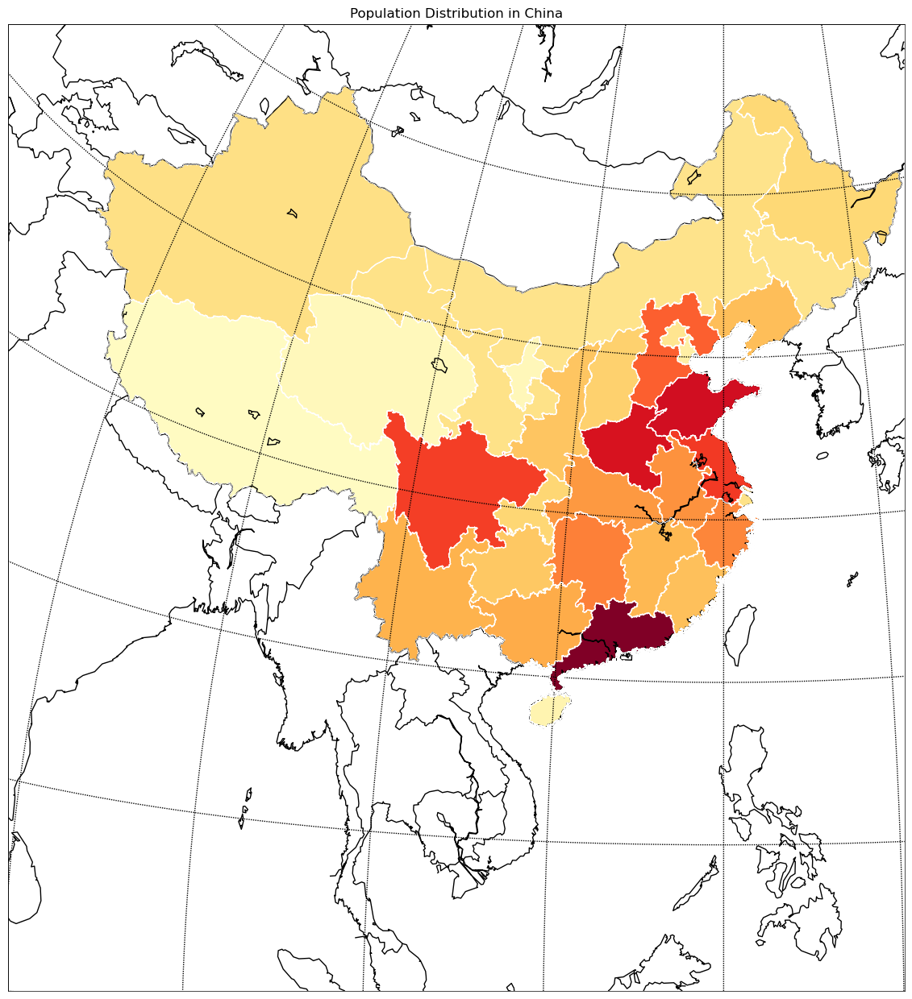

In [44]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import matplotlib
import pandas as pd

# 读取数据
popdata = pd.read_excel("provinces.xlsx")
provinces = np.array(popdata["province"][0:120])
pop = np.array(popdata["pop"][0:120])

def GetPopulationByProvince(province):

    # 函数的作用是输入一个城市,然后得到对应的人口数据,把城市和人口一一(for loop)对应(zip)起来
    for item in zip(provinces,pop):#('北京'，‘22000000’)
       
        if(item[0] == province  or item[0] in province ): #isin
            popData = item[1]
            return popData

# 建立画布
fig = plt.figure(figsize = (20,15))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8])

# 绘制地图底图
map = Basemap(llcrnrlon=80.33, 
              llcrnrlat=3.01, 
              urcrnrlon=138.16, 
              urcrnrlat=56.123,
             resolution='l', projection='cass', lat_0 = 42.5,lon_0=120,ax=ax1)
map.drawcoastlines(linewidth = 1)
map.drawcountries(linewidth = 1)
map.drawmapboundary(linewidth = 0.5)
map.drawparallels(np.arange(3,57,9))
map.drawmeridians(np.arange(80,140,10))

# 定义cmap颜色映射 plt.get_cmap
cmap = matplotlib.colormaps.get_cmap('YlOrRd')

# 读取省份划分的shp文件
file_path = 'CHN_adm1'
map.readshapefile(file_path,'states',drawbounds=True,color = 'w') # CHN_adm1的数据是中国各省区域

# 对省份着色
for info, shp in zip(map.states_info, map.states):
    proid = info['NL_NAME_1']  # 可以用notepad打开CHN_adm1.csv文件，可以知道'NAME_1'代表各省的名称
    popData = None
    for item in zip(provinces,pop):#('北京'，‘22000000’)
        if(item[0] == proid  or item[0] in proid ): #isin
        # 如果两个文件的省份名字终于在for循环中对应上了,那么就把人口的数值赋值给popData这个数值,然后中断循环,本质上还是数值的对应,来让cmap映射人口数量
            popData = item[1]
            break
        
    # 颜色映射
    poly = Polygon(shp,facecolor=cmap(popData / np.max(pop)),edgecolor='w', lw=1)
    ax1.add_patch(poly)

# 图纸输出
plt.title("Population Distribution in China")
plt.show()

In [49]:
import branca
import folium

with open("vietnam_topo.json", encoding='UTF-8') as f:
      provinces_topo_map = json.load(f)

with open("vietnam.geojson", encoding='UTF-8') as f:
      provinces_map = json.load(f)
        
df = pd.read_csv('landuse2.csv')
df.head()       

for index in np.arange(len(provinces_topo_map["objects"]["vietnam"]["geometries"])):
    result =  provinces_map['features'][index]['properties']['name']
    provinces_topo_map["objects"]["vietnam"]["geometries"][index]["Area"] = result
    

colorscale = branca.colormap.linear.BuGn_08.scale(0, 1)

def getRatioByArea(area):
    for row in df["Ratio"][df.Area == area]:
        #print(row)
        return row

def style_function(feature):
    
    employed = getRatioByArea(feature["Area"])
    
    return {
        "fillOpacity": 0.9,
        "weight": 0,
        "fillColor": "#black" if employed is None else colorscale(employed ),
    }

m1 = folium.Map( location=[14, 108],
    tiles="cartodbpositron",
    zoom_start=4,
)

colormap = branca.colormap.linear.BuGn_08.scale(0, 1)
colormap = colormap.to_step(index=[0,0.2, 0.4, 0.6, 0.8, 1])
colormap.caption = "Agricultural Land Use Percentage"
colormap.add_to(m1)

folium.TopoJson(
    provinces_topo_map,
     "objects.vietnam",
     style_function=style_function,
).add_to(m1)

folium.Circle(
    radius=500,
    location=[9.167179, 105.140565],
    popup="Ca Mau",
    color="red",
    fill= True,
).add_to(m1)

m1